In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression, SelectKBest
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RepeatedKFold
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from xgboost import XGBRegressor
import xgboost
import shap
import joblib

# from matplotlib.font_manager import FontProperties
# font = FontProperties(fname="/usr/share/fonts/truetype/myfonts/simhei.ttf")

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
df = pd.read_csv("C:\\Users\\wanli\\Desktop\\yield_prediction\\dataset\\tomato_focast_dataset_A_label.csv")
df.head()

,日期\n/Date,温室最高温度/Tmax (℃),温室最低温度/Tmin (℃),温室24小时均温/T24hs-Avg (℃),温室日间均温/Td-Avg (℃),温室夜间均温/Tn-Avg (℃),最高相对湿度/RHmax (%),最低相对湿度/RHmin (%),24小时平均相对湿度/RH24hs-Avg (%),日间平均相对湿度/RHd-Avg (%),...,24小时平均CO2浓度\n/CO2 24hs-Avg (ppm),日间平均CO2浓度\n/CO2 d-Avg (ppm),夜间平均CO2浓度\n/CO2 n-Avg (ppm),轨道加热日间管温/Railpipe Td (℃),轨道加热夜间管温/Railpipe Tn (℃),作物加热日间管温/Growpipe Td (℃),作物加热夜间管温/Growpipe Tn (℃),遮阴幕布启用时长\n/Shading Screen Duration (hs),保温幕布启用时长\n/Energy Screen Duration (hs),OT
0,12/20/2022,23.8,13.1,17.0,20.1,14.9,93.0,68.0,83.0,89.0,...,606.0,561.0,637.0,41.3,30.9,33.9,30.1,15.50,21.15,2759.68
1,12/21/2022,25.3,13.4,17.1,20.5,14.8,91.0,66.0,79.0,83.0,...,606.0,685.0,622.0,37.7,30.2,34.5,30.6,15.20,16.00,1854.92
2,12/22/2022,25.6,13.2,17.0,20.4,14.9,93.0,61.0,76.0,83.0,...,511.0,418.0,575.0,43.1,32.5,36.2,31.2,15.15,15.50,2790.00
3,12/23/2022,25.5,12.7,17.2,20.8,14.7,94.0,56.0,73.0,83.0,...,501.0,392.0,576.0,43.1,32.2,34.9,31.8,15.15,15.50,5946.00
4,12/24/2022,26.4,13.3,17.2,21.0,14.7,93.0,60.0,75.0,81.0,...,525.0,409.0,605.0,50.5,30.3,35.7,31.7,15.20,15.55,6328.00


In [3]:
df.describe()

,温室最高温度/Tmax (℃),温室最低温度/Tmin (℃),温室24小时均温/T24hs-Avg (℃),温室日间均温/Td-Avg (℃),温室夜间均温/Tn-Avg (℃),最高相对湿度/RHmax (%),最低相对湿度/RHmin (%),24小时平均相对湿度/RH24hs-Avg (%),日间平均相对湿度/RHd-Avg (%),夜间平均相对湿度/RHn-Avg (%),...,24小时平均CO2浓度\n/CO2 24hs-Avg (ppm),日间平均CO2浓度\n/CO2 d-Avg (ppm),夜间平均CO2浓度\n/CO2 n-Avg (ppm),轨道加热日间管温/Railpipe Td (℃),轨道加热夜间管温/Railpipe Tn (℃),作物加热日间管温/Growpipe Td (℃),作物加热夜间管温/Growpipe Tn (℃),遮阴幕布启用时长\n/Shading Screen Duration (hs),保温幕布启用时长\n/Energy Screen Duration (hs),OT
count,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,...,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000
mean,26.821846,15.461846,20.324308,23.185538,17.204615,93.892308,68.698462,84.612308,82.030769,87.636923,...,592.330769,572.789538,620.862462,23.264308,19.869846,25.752615,24.459692,11.132923,11.642154,8779.795692
std,2.236161,2.088406,2.336386,2.235255,2.090545,3.183305,10.330413,4.549844,6.035311,5.007142,...,40.938455,59.143779,34.480675,7.705118,5.753111,7.543444,8.674110,4.157999,4.457042,3958.791533
min,19.300000,8.800000,15.300000,17.500000,13.600000,79.000000,31.000000,67.000000,59.000000,67.000000,...,424.000000,375.700000,541.000000,12.300000,12.300000,11.500000,11.500000,0.000000,0.000000,1854.920000
25%,25.900000,13.800000,18.500000,21.800000,15.300000,92.000000,62.000000,82.000000,79.000000,86.000000,...,569.000000,536.300000,597.000000,15.900000,15.900000,17.200000,17.100000,8.500000,8.550000,5781.000000
50%,26.700000,15.300000,20.200000,23.100000,17.000000,94.000000,70.000000,85.000000,82.000000,88.000000,...,590.100000,562.100000,621.000000,22.500000,18.000000,27.400000,22.800000,12.000000,12.450000,7823.000000
75%,28.100000,17.100000,22.400000,24.900000,19.200000,96.000000,76.000000,87.000000,86.000000,90.000000,...,618.600000,611.000000,645.000000,27.900000,22.200000,31.600000,28.200000,14.200000,14.500000,11629.000000
max,31.900000,20.600000,25.700000,28.100000,21.900000,99.000000,92.000000,100.000000,99.000000,100.000000,...,687.000000,715.000000,736.000000,50.500000,43.900000,44.600000,45.500000,19.000000,22.200000,23752.000000


In [4]:
features_df = df.drop('OT', axis=1).drop('日期\n/Date', axis=1)
no_date_df = df.drop('日期\n/Date', axis=1)
tar = df['OT']
features_df.head()

,温室最高温度/Tmax (℃),温室最低温度/Tmin (℃),温室24小时均温/T24hs-Avg (℃),温室日间均温/Td-Avg (℃),温室夜间均温/Tn-Avg (℃),最高相对湿度/RHmax (%),最低相对湿度/RHmin (%),24小时平均相对湿度/RH24hs-Avg (%),日间平均相对湿度/RHd-Avg (%),夜间平均相对湿度/RHn-Avg (%),...,最低CO2浓度\n/CO2 Min (ppm),24小时平均CO2浓度\n/CO2 24hs-Avg (ppm),日间平均CO2浓度\n/CO2 d-Avg (ppm),夜间平均CO2浓度\n/CO2 n-Avg (ppm),轨道加热日间管温/Railpipe Td (℃),轨道加热夜间管温/Railpipe Tn (℃),作物加热日间管温/Growpipe Td (℃),作物加热夜间管温/Growpipe Tn (℃),遮阴幕布启用时长\n/Shading Screen Duration (hs),保温幕布启用时长\n/Energy Screen Duration (hs)
0,23.8,13.1,17.0,20.1,14.9,93.0,68.0,83.0,89.0,79.0,...,452.0,606.0,561.0,637.0,41.3,30.9,33.9,30.1,15.50,21.15
1,25.3,13.4,17.1,20.5,14.8,91.0,66.0,79.0,83.0,77.0,...,452.0,606.0,685.0,622.0,37.7,30.2,34.5,30.6,15.20,16.00
2,25.6,13.2,17.0,20.4,14.9,93.0,61.0,76.0,83.0,72.0,...,311.0,511.0,418.0,575.0,43.1,32.5,36.2,31.2,15.15,15.50
3,25.5,12.7,17.2,20.8,14.7,94.0,56.0,73.0,83.0,67.0,...,262.0,501.0,392.0,576.0,43.1,32.2,34.9,31.8,15.15,15.50
4,26.4,13.3,17.2,21.0,14.7,93.0,60.0,75.0,81.0,71.0,...,258.0,525.0,409.0,605.0,50.5,30.3,35.7,31.7,15.20,15.55


Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.


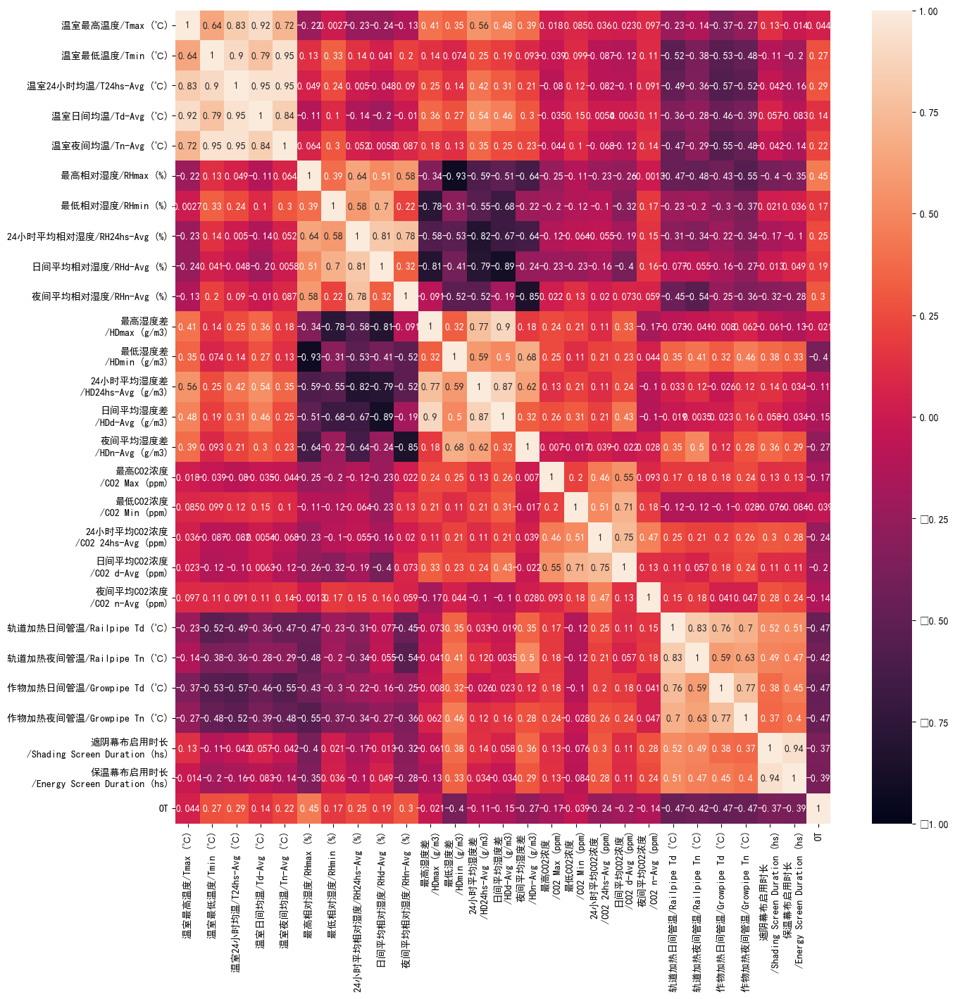

In [5]:
plt.rcParams['font.family'] = 'simhei' # 指定默认字体为黑体  
plt.figure(figsize=(15,15))
sns.heatmap(no_date_df.corr(), annot=True, vmin=-1, vmax=1)
# plt.rcParams['axes.unicode_minus'] = False
plt.show()

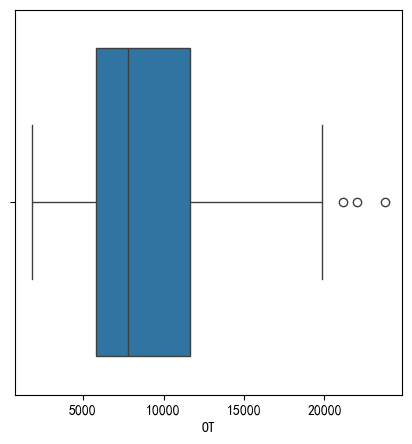

In [6]:
plt.figure(figsize=(5,5))
sns.boxplot(x='OT', data=no_date_df)
plt.show()

In [7]:
sns.pairplot(df, 
            height=4,
            plot_kws = {'alpha': 0.4, 's': 30, 'edgecolor': 'k'},
            corner=True
           )

In [8]:
df.nunique()

日期\n/Date                                  325
温室最高温度/Tmax (℃)                             91
温室最低温度/Tmin (℃)                             84
温室24小时均温/T24hs-Avg (℃)                      89
温室日间均温/Td-Avg (℃)                           89
温室夜间均温/Tn-Avg (℃)                           78
最高相对湿度/RHmax (%)                            19
最低相对湿度/RHmin (%)                            51
24小时平均相对湿度/RH24hs-Avg (%)                   28
日间平均相对湿度/RHd-Avg (%)                        34
夜间平均相对湿度/RHn-Avg (%)                        30
最高湿度差\n/HDmax (g/m3)                       100
最低湿度差\n/HDmin (g/m3)                        25
24小时平均湿度差\n/HD24hs-Avg (g/m3)               45
日间平均湿度差\n/HDd-Avg (g/m3)                    67
夜间平均湿度差\n/HDn-Avg (g/m3)                    36
最高CO2浓度\n/CO2 Max (ppm)                    245
最低CO2浓度\n/CO2 Min (ppm)                    222
24小时平均CO2浓度\n/CO2 24hs-Avg (ppm)           220
日间平均CO2浓度\n/CO2 d-Avg (ppm)                238
夜间平均CO2浓度\n/CO2 n-Avg (ppm)                212
轨道加热日间管温/Rail

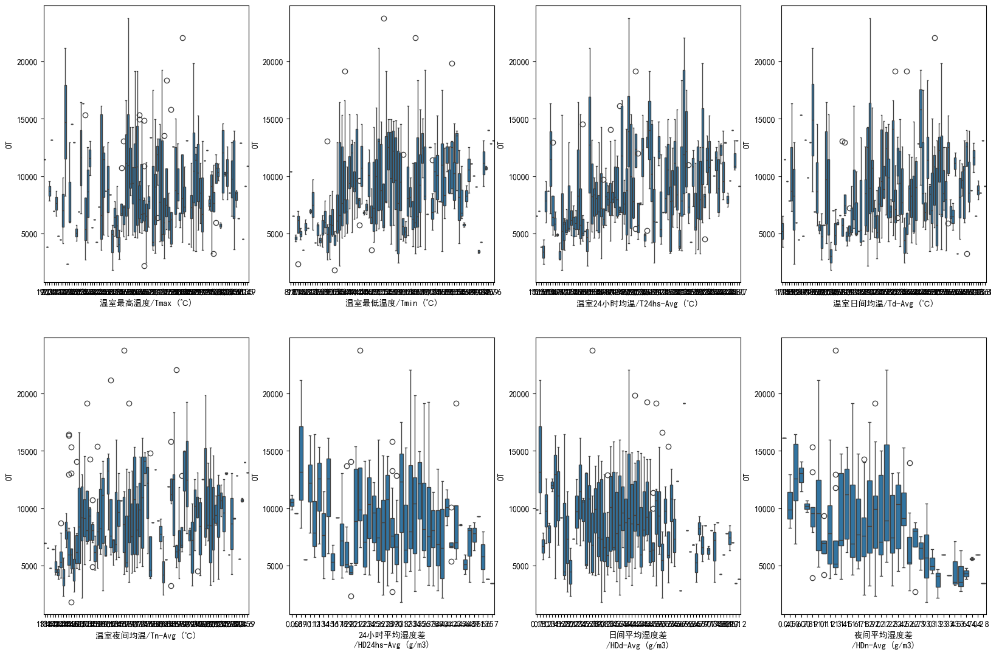

In [9]:
nominal_df = df[['温室最高温度/Tmax (℃)','温室最低温度/Tmin (℃)','温室24小时均温/T24hs-Avg (℃)','温室日间均温/Td-Avg (℃)',
               '温室夜间均温/Tn-Avg (℃)','24小时平均湿度差\n/HD24hs-Avg (g/m3)', '日间平均湿度差\n/HDd-Avg (g/m3)','夜间平均湿度差\n/HDn-Avg (g/m3)']]

fig, ax = plt.subplots(2,4, figsize=(20,13))
for e, col in enumerate(nominal_df.columns):
    if e<=3:
        sns.boxplot(data=df, x=col, y='OT', ax=ax[0,e])
    else:
        sns.boxplot(data=df, x=col, y='OT', ax=ax[1,e-4])       
plt.show()

In [10]:
mi_score = mutual_info_regression(features_df, tar, n_neighbors=3,random_state=42)
mi_score_df = pd.DataFrame({'columns':features_df.columns, 'MI_score':mi_score})
mi_score_df.sort_values(by='MI_score', ascending=False)

,columns,MI_score
23,作物加热夜间管温/Growpipe Tn (℃),0.327889
22,作物加热日间管温/Growpipe Td (℃),0.304950
20,轨道加热日间管温/Railpipe Td (℃),0.298949
21,轨道加热夜间管温/Railpipe Tn (℃),0.287932
24,遮阴幕布启用时长\n/Shading Screen Duration (hs),0.277587
25,保温幕布启用时长\n/Energy Screen Duration (hs),0.245369
14,夜间平均湿度差\n/HDn-Avg (g/m3),0.207380
1,温室最低温度/Tmin (℃),0.204204
9,夜间平均相对湿度/RHn-Avg (%),0.191747
4,温室夜间均温/Tn-Avg (℃),0.183819


In [11]:
X_clus = features_df[['温室最高温度/Tmax (℃)','温室最低温度/Tmin (℃)','温室24小时均温/T24hs-Avg (℃)','温室日间均温/Td-Avg (℃)',
               '温室夜间均温/Tn-Avg (℃)']]

scaler = StandardScaler()
scaler.fit(X_clus)
X_new_clus = scaler.transform(X_clus)

clustering = KMeans(n_clusters=3, random_state=42)
clustering.fit(X_new_clus)
n_cluster = clustering.labels_

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


In [12]:
features_df['n_cluster'] = n_cluster
df['n_cluster'] = n_cluster
features_df['n_cluster'].value_counts()

n_cluster
2    133
1    106
0     86
Name: count, dtype: int64

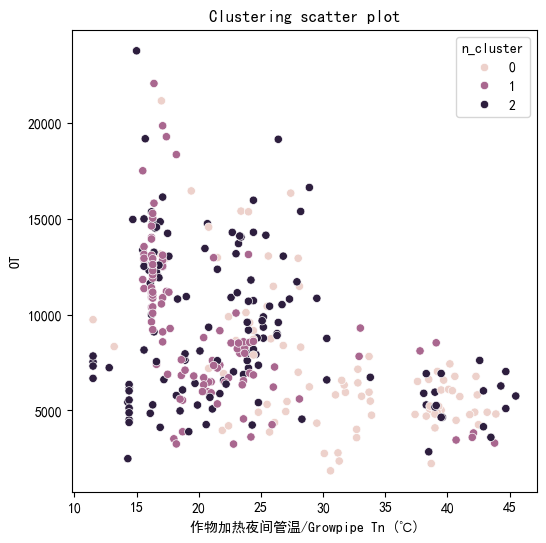

In [13]:
# let's plot most imporatant feature VS yield
plt.rcParams['font.family'] = 'simhei' # 指定默认字体为黑体
plt.figure(figsize=(6,6))
sns.scatterplot(x='作物加热夜间管温/Growpipe Tn (℃)', y='OT', hue='n_cluster', data=df)
plt.title("Clustering scatter plot")
plt.show()

In [14]:
features_set = ['作物加热夜间管温/Growpipe Tn (℃)','保温幕布启用时长\n/Energy Screen Duration (hs)',
               '作物加热日间管温/Growpipe Td (℃)','轨道加热日间管温/Railpipe Td (℃)',
               '轨道加热夜间管温/Railpipe Tn (℃)','遮阴幕布启用时长\n/Shading Screen Duration (hs)',
               '夜间平均湿度差\n/HDn-Avg (g/m3)', '温室最低温度/Tmin (℃)','夜间平均相对湿度/RHn-Avg (%)',
               'n_cluster']

# final dataframe
X = features_df[features_set]
y = tar.round(1)
X

,作物加热夜间管温/Growpipe Tn (℃),保温幕布启用时长\n/Energy Screen Duration (hs),作物加热日间管温/Growpipe Td (℃),轨道加热日间管温/Railpipe Td (℃),轨道加热夜间管温/Railpipe Tn (℃),遮阴幕布启用时长\n/Shading Screen Duration (hs),夜间平均湿度差\n/HDn-Avg (g/m3),温室最低温度/Tmin (℃),夜间平均相对湿度/RHn-Avg (%),n_cluster
0,30.1,21.15,33.9,41.3,30.9,15.50,2.7,13.1,79.0,0
1,30.6,16.00,34.5,37.7,30.2,15.20,3.0,13.4,77.0,0
2,31.2,15.50,36.2,43.1,32.5,15.15,3.6,13.2,72.0,0
3,31.8,15.50,34.9,43.1,32.2,15.15,4.2,12.7,67.0,0
4,31.7,15.55,35.7,50.5,30.3,15.20,3.6,13.3,71.0,0
...,...,...,...,...,...,...,...,...,...,...
320,42.9,14.40,44.6,28.7,32.5,14.40,3.4,18.5,80.0,2
321,40.7,14.10,30.4,31.2,36.0,13.55,4.8,17.8,71.0,1
322,42.1,14.05,28.7,32.0,25.9,13.50,3.7,16.8,79.0,1
323,42.0,15.25,34.2,29.4,27.9,14.45,3.6,19.3,79.0,1


In [15]:
# train and test dataset to build baseline model using GBT and RFs by scaling the dataset
mx_scaler = MinMaxScaler()
X_scaled = pd.DataFrame(mx_scaler.fit_transform(X))
X_scaled.columns = X.columns

In [16]:
# let's fit the data to the models
model_dict = {"abr": AdaBoostRegressor(), 
              "gbr": GradientBoostingRegressor(), 
              "rfr": RandomForestRegressor()
             }

for key, val in model_dict.items():
    print(f"cross validation for {key}")
    score = cross_val_score(val, X_scaled, y, cv=5, scoring='neg_mean_squared_error')
    mean_score = -np.sum(score)/5
    sqrt_score = np.sqrt(mean_score) 
    print(sqrt_score)

cross validation for abr
4567.255584341686
cross validation for gbr
5231.371923214338
cross validation for rfr
5063.331161107691


In [17]:
# split the train and test data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

bgt = GradientBoostingRegressor(random_state=42)
bgt.fit(X_train,y_train)
preds = bgt.predict(X_test)
score = bgt.score(X_train,y_train)
rmse_score = np.sqrt(mean_squared_error(y_test, preds))
r2_score = r2_score(y_test, preds)
print("RMSE score gradient boosting machine:", rmse_score)      
print("R2 score for the model: ", r2_score)

RMSE score gradient boosting machine: 2431.5072187693545
R2 score for the model:  0.5457496845031596


In [18]:
# K-fold split the dataset
kf = KFold(n_splits = 5, shuffle=True, random_state=0)

# params grid for tuning the hyperparameters
param_grid = {'n_estimators': [100,200,400,500,800],
             'learning_rate': [0.1,0.05,0.3,0.7],
             'min_samples_split': [2,4],
             'min_samples_leaf': [0.1,0.4],
             'max_depth': [3,4,7]
             }

# GBR estimator object 
estimator = GradientBoostingRegressor(random_state=42)

# Grid search CV object 
clf = GridSearchCV(estimator=estimator, param_grid=param_grid, cv=kf, 
                   scoring='neg_mean_squared_error', n_jobs=-1)
clf.fit(X_scaled,y)

# print the best the estimator and params
best_estim = clf.best_estimator_
best_score = clf.best_score_
best_param = clf.best_params_
print("Best Estimator:", best_estim)
print("Best score:", np.sqrt(-best_score))


Best Estimator: GradientBoostingRegressor(learning_rate=0.05, max_depth=7, min_samples_leaf=0.1,
                          n_estimators=200, random_state=42)
Best score: 2911.569535183821


Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.


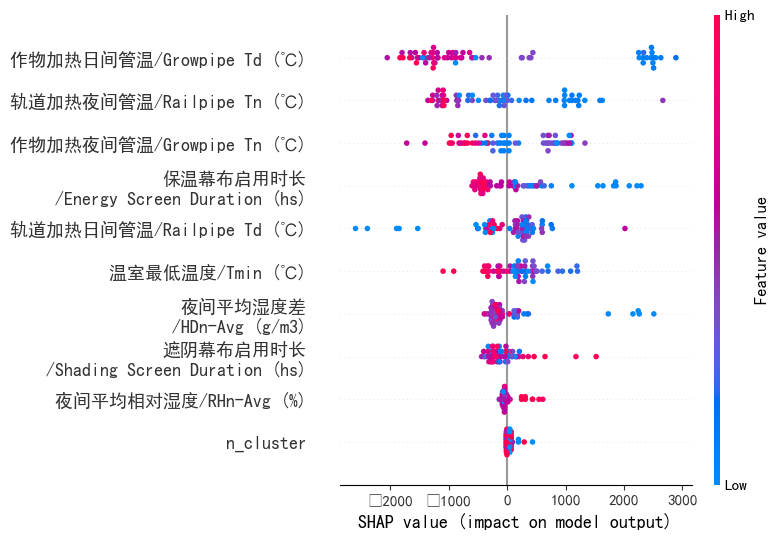

In [19]:
# shaply tree explainer
shap_tree = shap.TreeExplainer(bgt)
shap_values = shap_tree.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

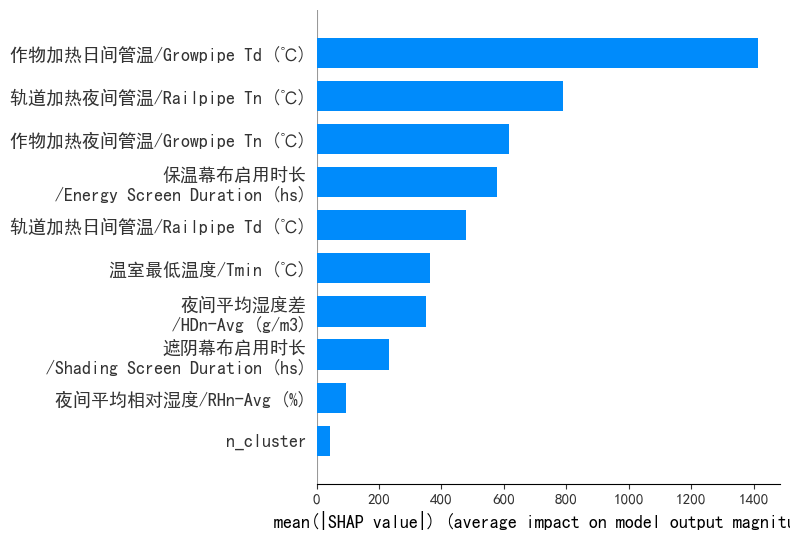

In [20]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [21]:
# repeated kfold to 
cv = RepeatedKFold(n_splits= 5, n_repeats = 3, random_state = 1)
fs_info_v0 = SelectKBest(score_func = mutual_info_regression)

# define pipeline object
pipe_rf = Pipeline([
    ('sel', fs_info_v0), 
    ('model', RandomForestRegressor(random_state=1))
])

pipe_xgb = Pipeline([
    ('sel', fs_info_v0), 
    ('model', XGBRegressor(random_state=1))
])

In [22]:
# prepare the parameters grid
grid_params_rf = [{'sel__k': [i for i in range(X_train.shape[1]-6, X_train.shape[1]-4)],
                   'model__max_depth': [15, 18, 10],
                   'model__min_samples_split': [15, 18, 10],
                   'model__n_estimators': [100,200,400,500]
                  }]

grid_params_xgb = [{'sel__k': [i for i in range(X_train.shape[1]-6, X_train.shape[1]-4)],
                    'model__max_depth': [9,12],
                    'model__min_child_weight': [7,8],
                    'model__subsample': [i/10. for i in range(9,11)]
                   }]

In [23]:
# set up the gridsearchCV objects
RF = GridSearchCV(estimator=pipe_rf,
            param_grid=grid_params_rf,
            scoring='neg_mean_absolute_error',
            cv=cv, 
            n_jobs= -1)

XGB = GridSearchCV(estimator=pipe_xgb,
            param_grid=grid_params_xgb,
            scoring='neg_mean_absolute_error',
            cv=cv, 
            n_jobs= -1)

# list of regression models
grids = [RF,XGB]

# Creating a dict for our reference
grid_dict = { 
        0: 'Random Forest',
        1: 'XGBoost'
    }

In [24]:
# Start form initial scaled model: X_train and X_test, y_train and y_test
def extract_best_model(grids: list, grid_dict: dict):
    print('Performing model optimizations...')
    least_mae = 270817
    best_regr = 0
    best_gs = ''
    for idx, gs in enumerate(grids):
        print('\nEstimator: %s' % grid_dict[idx])
        gs.fit(X_train, y_train)
        print('Best Config: %s' % gs.best_params_)
        # Best training data accuracy
        print('Best MAE: %.3f' % gs.best_score_)
        # Predict on test data with best params
        y_pred_v0 = gs.predict(X_test)
        # Test data accuracy of model with best params
        print('Test set mean absolute error for best params: %.3f ' % mean_absolute_error(y_test, y_pred_v0))
        print('Test set root mean squared error for best params: %.3f ' % np.sqrt(mean_absolute_error(y_test, y_pred_v0)))
        
        # Track best (least test error) model
        if mean_absolute_error(y_test, y_pred_v0) < least_mae:
            least_mae = mean_absolute_error(y_test, y_pred_v0)
            best_gs = gs
            best_regr = idx
    print('\nClassifier with least test set MAE: %s' % grid_dict[best_regr])

    
    return (grid_dict[best_regr], best_gs, least_mae)

In [25]:
best_model_name_v0, best_model_v0, least_mae_v0 = extract_best_model(grids= grids, grid_dict = grid_dict)

print(f"Best Model: {best_model_name_v0}")
print(f"Error Rate: {least_mae_v0}")
print(best_model_v0)

Performing model optimizations...

Estimator: Random Forest
Best Config: {'model__max_depth': 15, 'model__min_samples_split': 10, 'model__n_estimators': 100, 'sel__k': 5}
Best MAE: -2214.317
Test set mean absolute error for best params: 1986.892 
Test set root mean squared error for best params: 44.575 

Estimator: XGBoost
Best Config: {'model__max_depth': 12, 'model__min_child_weight': 7, 'model__subsample': 1.0, 'sel__k': 5}
Best MAE: -2374.722
Test set mean absolute error for best params: 2195.689 
Test set root mean squared error for best params: 46.858 

Classifier with least test set MAE: Random Forest
Best Model: Random Forest
Error Rate: 1986.8915698211918
GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=1),
             estimator=Pipeline(steps=[('sel',
                                        SelectKBest(score_func=<function mutual_info_regression at 0x000001FA5ED93B80>)),
                                       ('model',
                                     

In [26]:
# remove the 'n_cluster' feature from the dataset
X_train_n = X_train.drop('n_cluster', axis=1)
X_test_n = X_test.drop('n_cluster', axis=1)

# train a model for flask API creation =
xgb_model = XGBRegressor(max_depth=9, min_child_weight=7, subsample=1.0)
xgb_model.fit(X_train_n, y_train)
pr = xgb_model.predict(X_test_n)
err = mean_absolute_error(y_test, pr)
rmse_n = np.sqrt(mean_squared_error(y_test, pr))

# after training, save the model using joblib library
joblib.dump(xgb_model, 'wbb_xgb_model2.joblib')

['wbb_xgb_model2.joblib']